# **Section:** FP

In [1]:
import os
import itertools as it
import warnings
import time
import pickle

import numpy as np

import pandas as pd

%matplotlib inline
from matplotlib import pyplot as plt
from matplotlib import cm
import seaborn as sns

import joblib

import pathlib

import feets.preprocess

from sklearn.ensemble import RandomForestClassifier
from sklearn.exceptions import DataConversionWarning
from sklearn.model_selection import (
    KFold, StratifiedKFold, train_test_split)

from sklearn import metrics

from PyAstronomy.pyasl import foldAt

import tqdm

from libs.container import Container
from libs.nearest import nearest
from libs.experiment import WithAnotherExperiment, roc, metrics
from libs.precstar import  prec_star

warnings.simplefilter("ignore", category=DataConversionWarning)

/home/jbcabral/miniconda2/envs/howfar/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.metrics.ranking module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


In [7]:
%%time

PATH = pathlib.Path(os.path.abspath(os.path.dirname("")))

DATA_PATH = PATH / "_data"

COLUMNS_NO_FEATURES = ['id', 'tile', 'cnt', 'ra_k', 'dec_k', 'vs_type', 'vs_catalog', 'cls'] 

path = "_data/full.pkl.bz2"

train_datas = {}

sample = pd.read_pickle(path)

# the features
X_columns = [c for c in sample.columns if c not in COLUMNS_NO_FEATURES]
y_column = "cls"

sample[X_columns] =  sample[X_columns].astype(np.float32)

data = Container({k: v for k, v in sample.groupby("tile")})

del sample

CPU times: user 5min 13s, sys: 6min 10s, total: 11min 23s
Wall time: 4min 20s


In [8]:
CACHE_FOLDER = pathlib.Path("_cache") / "FP"

def cache_or_run(*, fname, run, force=False):
    path = CACHE_FOLDER / fname
    if not isinstance(path, pathlib.Path):
        path = pathlib.Path(path)
    
    if path.exists() and not force:
        print("cache")
        return joblib.load(path)
    
    value = run()
    joblib.dump(value, path, compress=3)
    return value

In [9]:
CACHE_FOLDER = pathlib.Path("_cache") / "ALL_kfolds"
thresholds = joblib.load(CACHE_FOLDER / "thresholds.pkl.bz2")
thresholds

{'b206': 0.49,
 'b214': 0.33599999999999997,
 'b216': 0.394,
 'b220': 0.536,
 'b228': 0.28600000000000003,
 'b234': 0.42600000000000005,
 'b247': 0.6799999999999999,
 'b248': 0.652,
 'b261': 0.654,
 'b262': 0.5800000000000001,
 'b263': 0.5700000000000001,
 'b264': 0.628,
 'b277': 0.43600000000000005,
 'b278': 0.49,
 'b360': 0.19399999999999995,
 'b396': 0.010000000000000009}

In [10]:
%%time
ensemble = joblib.load(CACHE_FOLDER / "ensemble.pkl.bz2")

CPU times: user 3.72 s, sys: 153 ms, total: 3.88 s
Wall time: 3.88 s


In [20]:
def clf_table(tile, results):
    
    fix_recall, fix_precs = {}, {}
    for r in results:
        train_name, test_name = r["train_name"], r["test_name"]
        if test_name == tile:
            break
    
    efold_thrs = np.average([v for k, v in thresholds.items() if k != train_name])
    probs = r["probabilities"][:,1]
    predicted = (probs >= efold_thrs).astype(int)
    
    df = data[tile].copy()
    df["predicted"] = predicted
    df["FP"] = ((r.real_cls == 0) & (predicted == 1))
    df["FN"] = ((r.real_cls == 1) & (predicted == 0))
    df["threshold"] = [efold_thrs] * len(data[tile])
    df["probs"] = probs
    
    return df 


def get_falses():
    fps = Container()
    fns = Container()
    for tile in data.keys():
        df = clf_table(tile, ensemble)
        fps[tile] = df[df.FP]
        fns[tile] = df[df.FN]
    return fps, fns

fps, fns = get_falses()

In [42]:
%%time

def load_lcs(tile, ids):
    if len(ids) == 0:
        return []
    fpath = f"/home/jbcabral/carpyncho3/production_data/stored/light_curves/{tile}/lc_obs_{tile}.npy"
    lc = pd.DataFrame(np.load(fpath))
    lc = lc[lc.bm_src_id.isin(ids)]
    return lc
    
    
def get_lcs(fps, fns):
    all_ids = Container()
    for tile in data.keys():
        cont = all_ids.setdefault(tile, [])
        cont.extend(fps[tile].id.values)
        cont.extend(fns[tile].id.values)
    with joblib.Parallel(n_jobs=-1) as P:
        lcs = P(
            joblib.delayed(load_lcs)(tile, ids) for tile, ids in all_ids.items())
        
    return pd.concat(lcs, ignore_index=True, sort=False)


lcs = cache_or_run(
    fname="lcs.pkl.bz2",
    run=lambda: get_lcs(fps, fns),
)

cache
CPU times: user 1.43 s, sys: 27.8 ms, total: 1.46 s
Wall time: 1.46 s


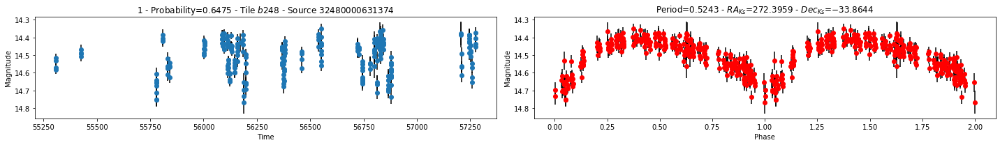

In [119]:
def get_ts(lcs, id):
    ts = lcs[lcs.bm_src_id == id]
    
    time, mag, err = (
        ts.pwp_stack_src_hjd.values, 
        ts.pwp_stack_src_mag3.values, 
        ts.pwp_stack_src_mag_err3.values)
    
    sort = np.argsort(time)
    
    time, mag, err = time[sort], mag[sort], err[sort]
    time, mag, err = feets.preprocess.remove_noise(time, mag, err, std_limit=3)
    return time, mag, err


def plot_lc(*, tax, pax, sid, lcs, fps):
    time, mag, err = get_ts(lcs, sid)
    
    src = fps[fps.id == sid]
    period = src.PeriodLS.values[0]
    tile = src.tile.values[0]
    prob = src.probs.values[0]
    vs_type = src.vs_type.values[0]
    ra_k = float(src.ra_k.values[0])
    dec_k = float(src.dec_k.values[0])
    
    
    tax.errorbar(time, mag, err, ls="", marker="o", ecolor="k")
    tax.set_xlabel("Time")
    tax.set_ylabel("Magnitude")
    tax.set_title(f"Probability=${prob:.4f}$ - Tile ${tile}$ - Source ${sid}$")
    tax.invert_yaxis()
    
    t0 = np.min(mag)
    
    phases = foldAt(time, period, T0=t0)
    sort = np.argsort(phases)
    
    phases, pmag, perr = phases[sort], mag[sort], err[sort]
    phases = np.hstack((phases, phases + 1))
    pmag = np.hstack((pmag, pmag))
    perr = np.hstack((perr, perr))
    
    
    pax.errorbar(phases, pmag, perr, ls="", marker="o", ecolor="k", color="r")
    if vs_type:
        pax.set_title(f"Period=${period:.4f}$ - $RA_{{Ks}}$=${ra_k:.4f}$ - $Dec_{{Ks}}$=${dec_k:.4f}$ - {vs_type}")
    else:
        pax.set_title(f"Period=${period:.4f}$ - $RA_{{Ks}}$=${ra_k:.4f}$ - $Dec_{{Ks}}$=${dec_k:.4f}$")
    pax.set_xlabel("Phase")
    pax.set_ylabel("Magnitude")
    
    pax.invert_yaxis()


def plot_tile_lc(tile, fps, lcs):
    df = fps[tile]
    ids = df.sort_values("probs", ascending=False).id.values
    
    size = len(ids)
    fig, all_axs = plt.subplots(size, 2, figsize=(20, 3 * size))
    if np.ndim(all_axs) == 1:
        all_axs = [all_axs]
    
    idx = 1
    for sid, axs in zip(ids, all_axs):
        plot_lc(tax=axs[0], pax=axs[1], sid=sid, lcs=lcs, fps=df)
        axs[0].set_title(f"{idx} - {axs[0].get_title()}")
        idx += 1
    
    return fig, axs

fig, axs = plot_tile_lc(tile="b248", fps=fps, lcs=lcs)
fig.tight_layout()

## FP - New Variable Stars

In [122]:
%%time
fig, axs = plot_tile_lc(tile="all", fps={"all": pd.concat(fps.values())}, lcs=lcs)
fig.tight_layout()
fig.savefig("fps.pdf")

CPU times: user 2min 33s, sys: 2.82 s, total: 2min 35s
Wall time: 2min 35s


## FN - Bad classify Old-Variable stars

In [56]:
all_fns = pd.concat([fn for fn in fns.values()])

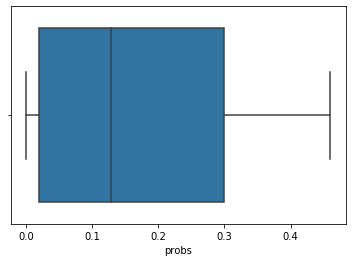

In [57]:
sns.boxplot(all_fns.probs)

In [77]:
all_fns = all_fns.sort_values("probs")

CPU times: user 23.6 s, sys: 326 ms, total: 23.9 s
Wall time: 24.1 s


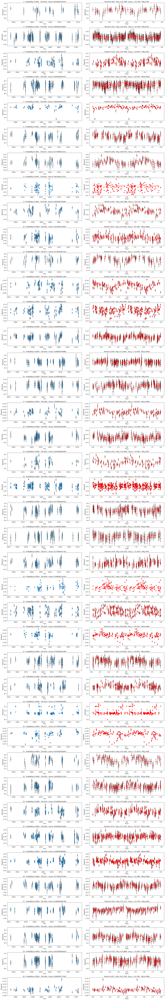

In [121]:
%%time
fig, axs = plot_tile_lc(tile="all", fps={"all": all_fns[:40]}, lcs=lcs)
fig.tight_layout()
fig.savefig("fns.pdf")

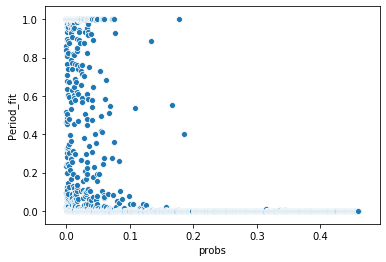

In [132]:
sns.scatterplot(x="probs", y="Period_fit", data=all_fns)